# NOTES CPSC 330


### LECTURE 1: Intro

* What is ML? 

Field of inquiry devoted to understanding and building methods that 'learn', that is, methods that leverage data to improve performance on some set of tasks. It is seen as part of Artificial Intelligence.

Machine learning algorithms build a model based on sample data, known as training data, in order to make predictions or decisions without being explicitly programmed to do so.

Example: train algorithm to recognize if an email is spam or not. 

* Types of ML

- supervised learning \
Training a model from input data and its corresponding targets to predict targets for new examples.
- unsupervised learning \
Training a model to find **patterns** in a dataset, typically an unlabeled dataset. (grouping)
- reinforcement learning \
A family of algorithms for finding suitable actions to take in a given situation in order to maximize a reward.
- recommendation systems \
Predict the "rating" or "preference" a user would give to an item.

<br><br>

### LECTURE 2: Decision Tree

- different kind of machine learning (supervised, non supervised)
- spam emails and price deciding for rent are supervised

1. examples (supervised VS unsupervised)
- finding groupes of similar properties in a real estate dataset: unsupervised
- Predicting real estate prices based on house features like number of rooms, learning from past sales as examples: supervised
- Grouping articles on different topics from different news sources (something like the Google News app): unsupervised
- Detecting credit card fraud based on examples of fraudulent and non-fraudulent transactions: supervised 

"trigger word": grouping -> unsupervised

2. examples (classification or regression)
- Predicting the price of a house based on features such as number of bedrooms and the year built: regression
- Predicting if a house will sell or not based on features like the price of the house, number of rooms, etc: classification
- Predicting percentage grade in CPSC 330 based on past grades: regression
- Predicting whether you should bicycle tomorrow or not based on the weather forecast: classification

3. Order of steps to build a ML model using sklearn:
- read the data 
- creating x,y
- creating a model instance (classifier object) 
- `fit` the classifier 
- `predict` on new examples
- `score` to evaluate the performance of the given model

note: with the new dataset, we have the 'features' only and not the 'target'. we want to estimate/predict the target

4. Why do we train a dummy classifier?
- to have a lower bound reference to compare our future classifiers

note: its the 'dumbest' most obvious answer, for example walk in a class, 'dark hair' would be the dummy classifier because it is the most common possible answer. duummy classifier would be most likely right no matter the features.

note: regression baseline is the most common answer based on average, for ex height in a room 5'6.

5. Decision Trees

For our "A+ quiz2" example, we can simply do a "if-else" statement.

In [3]:
class_attendance = 1
quiz1 = 1
quiz2 = ""

if class_attendance == 1 and quiz1 == 1:
    quiz2 == "A+"

Decision Tree algorithm: a ML algorithm to derive such rules from data in principles way. Have you ever played "20 questions games", decision trees are based from this idea. 

What is the best "split" to decide if a prediction is A or B? for example, what grade for lab3 would decide True or False to the next decision tree? Do we choose the mean? the median?
-> prof said by trial. they came up with 83.5.

It also depends on the distribution. say we know most people get around 80%, we choose this.

Adding parameters, hyperparameters help control growth of tree. It is like adding more "rules" to the tree.
For example: 100 students sample, split a node if threashold less than 90 in one node. for ex, if 99 students would go true, then block this process.
another example rule: limit of how far down we go in three. 
another example rule: if reached minimum amount sample, stop. 

6. Terminologies
- X: features(d), d number of
- y: targets
- tabular data: data display in tabular format
- examples: samples (usually rows)
- training: learning or fitting

- classification problem: predicting among two or more discrete classes \
ex: A+ or not A+
- regression problem: predicting a continuous value \
ex: actual score 90 to 100

7. Baselines

Main goal ML is to find mapping function X to y in order to predict outcome of unseen data.

"Baseline" is the most common answer, or "the answer we would guess if no algorithm is found". For example, count outcomes, the outcome with the most repeated value is the baseline. 

In sklearn, the baseline model for classification is `DummyCLassifier` (classifier)

step highlight: create X and y
- to create X, df.drop the 'last' column
- to create y, use that dropped column

* `score` gives the $accuracy = \frac{\text{correct predictions}}{\text{total examples}}$
* error = 1 - accuracy

In sklearn, the baseline model for regression is `DummyRegressor` (classifier) whcih predicts mean, median, or constant value of the training set.

The fit and predict are similar to classification. However "accuracy" does not make sense here, the `score` method here is $R^2$. If $R^2=-1$ then worst predictions, if $R^2=1$ then perfect predictions. Baseline model is close to $R^2=0$.


8. Decision Trees

- want a better result than the baseline
- start with binary decisions, 0 bad 1 good, count and give results.  Do that with "if" statements. However not feasible when data is large. 

- A decision tree is an algorithm that derive such rules from data in a principled way. 
- Terms: root node, nodes, leaves, branches, tree depth in a Flowchart. 
- How does fit work for tree: it is like 20-questions game. Keep asking questions (T/F answers) until narrow down the options. We minimize 'impurity' at each question. Usually use Gini index.
- DT also used for regression. Instead of Gini, use some other criteria for slitting, usually mean squared error (MSE). 

9. More terminology 

- **Parameters**: DT algorithm learns 1. the best feature to split on, 2. the threshold for the feature to split. These are called parameters. 
- Counts: how it is split at each node (10 vs 11). 
- Pure leaves: when the count is (0 vs 8) for a leaf, which means there is only 1 class available for this decision.
- It is possible to train the DT to render paths until only pure leaves.

- **Hyperparameters**: A 'knob' we can set to 'control' the training. For example, the depth of the tree. How to choose the HP? later discussed. 
- Decision Stump: a DT with only one split (depth = 1)

- **Decision boundary**: What sort of test examples will the model classify as positive, and what sort will it classify as negative?
- Say we have a decision stump with 2 options. There is a line separating the red region and the blue region which is called the decision boundary of the model. The more complex the model is, the more complex is the decision boundary. No longer just a line but 'shapes' to delimit better the datapoints on the plot.


## Lecture 3 Fundamentals

1. Generalization 
- refers to ability of a ML model to correctly classify new unseen examples. 
- bad example: colored shirt predicted by size of shirt. there is no correlation. however, in the training, the program got 100% accuracy but in the wild with real data, accuracy will be low or even wrong here. 
- reasons: some ML models learning 'too much', the rules given apply only to a few samples in the training set. 

2. Data Splitting
- looking at the prediction accuracy on the training set will not give us a good estimate of what the error will be on the new samples. 
- we normally split the original set and set aside a few samples for testing.
- validation set: test how well the data was trained, 'validate' to see if model can go wild.
- could change the hyperparameters to improve the validation set. 
- 3 steps: \
-- training set: samples on which the model learns, usually the largest set. \
-- validation set: set used for the HP tuning and model assessment. \
-- testing set: set used to get an estimate of 'real life' error, use it once.
- Why is it important that train_test_split picks samples at random and not in order? \
If the features are ordered by some criteria, not all representative samples would end up in the training set. For example, date 1 to 10, if we take sample 1-5, then model is not trained on 6-10 dates.

3. Cross-validation
- Definition: process of running the validation multiple times, with a different section of the train data to avoid single validation problems. \
You might get unlucky with your splits such that they dont align well or dont well represent your test data. \
Cross-validation provides a solution to this problem. Split the data into $k$ folds ($k > 2$, often $k=10$). In the picture below $k=4$. \
Each "fold" gets a turn at being the validation set. \
Note that cross-validation doesn't shuffle the data; it's done in train_test_split. \
Each fold gives a score and we usually average our  results. 

- the purpose of the CV is to evaluate how well the model will generalize to unseen data. 
- k-fold cross-validation calls fit k times. 
- I have 120 samples and I save 20 for the testing set, then I develop my model using 10-fold cross-validation? \
-- How many samples are in each training set? 90 \
-- How many samples are in each validation set? 10 \
-- How many samples will be used to train the final model? 100 

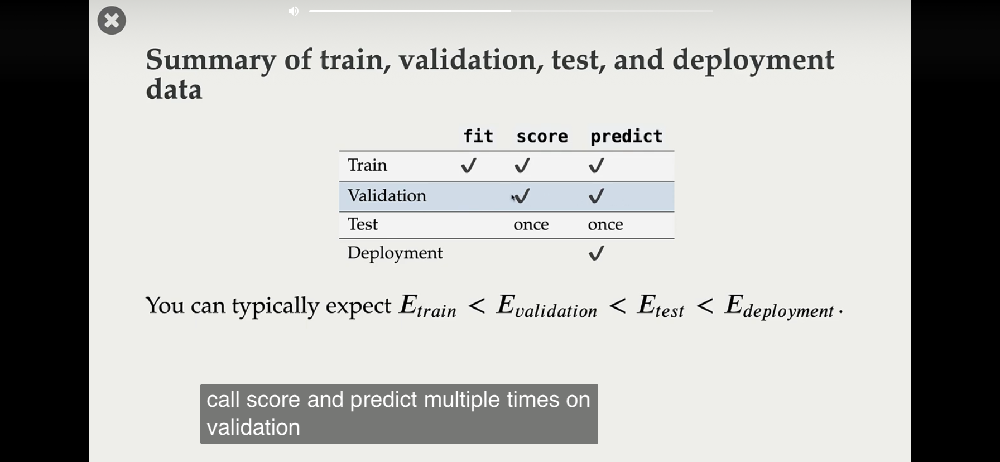

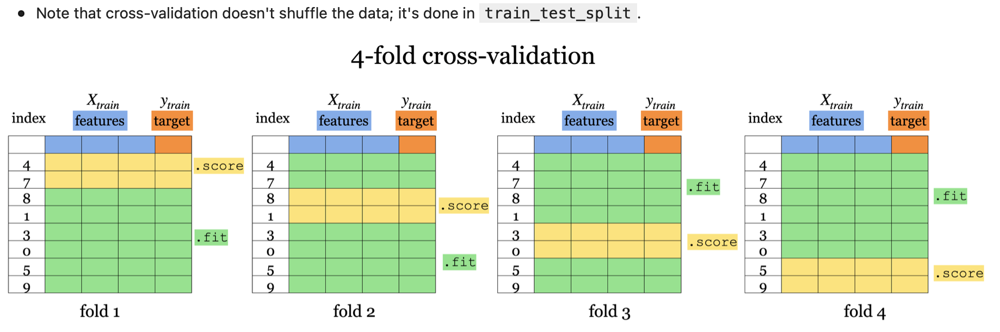

- Each fold gives a score and we usually average our $k$ results. 
- It's better to examine the variation in the scores across folds.  
- Gives a more **robust** measure of error on unseen data.
- The purpose of cross-validation is to **evaluate** how well the model will generalize to unseen data. 

4. The fundamental trade-off 
- types of errors \
-- $E_{train}$ is your training error (or mean train error from cross-validation). \
-- $E_{valid}$ is your validation error (or mean validation error from cross-validation). \
-- $E_{test}$ is your test error. \
-- $E_{best}$ is the best possible error you could get for a given problem. 

- underfitting \
model too simple. pick up some quirks and wont even capture useful patterns in the training data. Both train and validation errors would be high (more  20%), accuracy low. The gap between train and validation error is going to be lower. \
$E_{best} < E_{train} \approx E_{valid}$

- overfitting \
model learn too much. it learned a too specific example. will learn unreliable patterns and quirks in order to get every single training example correct. The training error is going to be very low, the validation error is high. But there will be a big gap between the training error and the validation error. Thus Evalid does not necessarily decrease with the Etrain. \
$E_{train} < E_{best} < E_{valid}$
* inevitably, the model will learn more from the training set than the validation set. the gap between the errors of both will widen. thus we must chose the most ideal "depth" that still capture a trend of reducing error of the validation set.

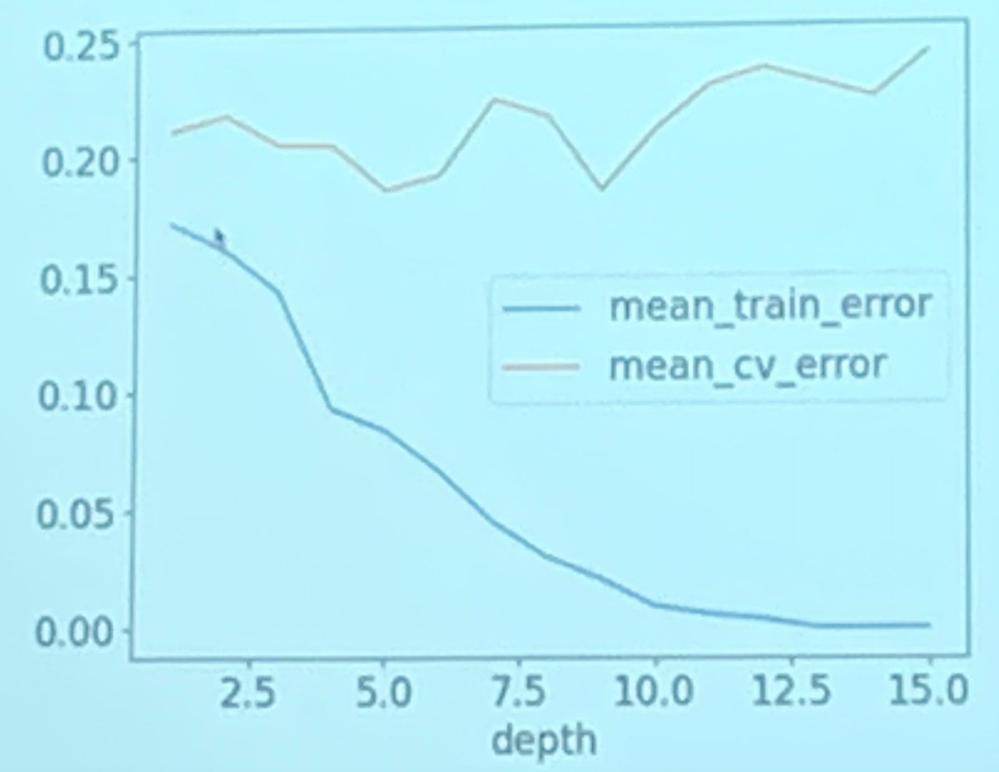

- How to pick a model that would generalize better? Avoid under/over, want to be consistent with the training data but we dont want to rely too much on it. 
- **The fundamental tradeoff of supervised ML**: as you increase model complexity, Etrain tends to go down but (Evalid - Etrain) tends to go up. 
- **bias VS variance tradeoff**: \
-- bias: tendency to consistently learn the same wrong things, not enough info. simple decision boundary. (high BS = underfitting). \
-- var: the tendency to learn random things irrespective of the real signal, too much info. complicated decision boundary. (high var = overfitting). small change = large effects 

* ideal: we want to be consistent with the training data but we dont want to rely too much on it. Want find sweetspot under/over.
* common practice pick model with minimum cross-validation error. (and thus finding "best depth")
- **The Golden Rule**: The Test Data cannot influence the training phase in any way.
- why?: our test data is a proxy of our deployment data, that is our unseen examples. if our training phase is influence by the testing phase, the data is not unseen anymore. so it wont be a good proxy anymore. dont train the model on the test data, risk of low accuracy in deployment. 
- test split in "chess lock" to avoid using it. 
- Issue that might come: sample too small, thus too much variability. say testing sample only 4, the a change in one answer will change accuracy by 25%. 
- solution: cross-validation. GOAL: to have more robust measure of accuracy. 
- we want large k, k for "division of the training data". We get "more accuracy points, then we average them". we cant take low k, because the problem will stay the same, we still dont have enough samples. 


## Lecture 4 KNN + SVM 


1. Analogy-based models
- An intuitive way to classify the test example is by finding the most similar examples from the training set and using that label for the test example
- examples: face recognition, recommendation system 
-  k-nearest neighbor: given a new data point, predict the class of the data point by finding the closest data point in the training set.
- say we choose 3 nearest neighbors, we get 2 blue and 1 red. thus the green point is classified as 'blue'. 
- dimension: how many columns, represents the dimensional space of the ML. low (20), medium (1000), high (100000).
- feature vector: composed of feature values associated with an example.
- how do we know if two points are similar? calculate distance, the closer the more similar

2. Method
- take sample of cities
- sample 1 city (test point, or query point) the "black point"
- predict the same label as the closest point 
- now do for multiple k
- from sklearn.neighbors import KneighborsClassifier
- how to choose k? to avoid under/over? (next few numbers are means) 
- for k=1, train_score = 1 and test_score (validation) = 0.75. High difference thus overfitting 
- for k=100, train_score = 0.6 and test_score (validation) = 0.6. Low difference thus underfitting 
- use a scalor, k = [1,100]. PLay until get good score for both 
- optimal this case: k=11, train_score = 0.8 and test_score = 0.8.
- now assess on the test data using k=11. We can test accuracy = 0.9.

3. Class notes
- want to lower error for train set but also find lowest error for validation set. CLass example: depth = 5 best. 
- high value k: underfitting. low value k: overfitting
- questions (T/F): \
-- unlike with decision trees, KNN most of the work is done at the prediction stage (T). there is no 'learning'. the prediction is slow because for a new point we want to test, we need to test the distance between each point. however, decision trees take longer to build the training but the prediction is quick.  \
-- with KNN, setting the hyperparameter k to larger values typically reduces training error (F). large values of K will bring value of the training set UP. \
-- similar to decision trees, KNN finds a small set of good features (F). DT will pick relevant good features. but KNN does not have this property, will have to compute distance each time.  \
-- in KNN, the classification of the closest neighbor to the test example always contributes the most to the prediction. (F). Rephrase: "is the closest point worth more?" answer is no, its just a majority vote. 
- open questions: \
-- k ODD is advised, because say k=3, we will get a majority class (2 red vs 1 blue for example). if it was even say k = 2, we can get a draw (1 red 1 blue) and there is no improvement. \
-- diagonal entries of the euclidian distance matrix were changed from 0 to infinity. Why? 0 is a distance to 0 between two points, so its 'point on itself'. but when we search for the closest distance between point A and B, the min fn will search in A and all the other points, not A and A. \
-- why is the training error always 0.0 when k=1? it is just the closest one so you cant get it wrong. closest to A is B without error of the color. 
- pros KNN: easy to understand and interpret, simple hyperparameter k, controlling the fundamental tradeoff, lazy learning in training fit: takes no time to fit.
- cons KNN: very slow during prediction time, especially when the training set is very large. better approaches with better test accuracy. in particular:
- "Curse of dimensionality": for all learners but especially KNN. KNN good for small samples d but fall apart when d increases. if there are many irrelevant attributes, KNN is hopelessly confused because all of them contribute to finding similarity between examples. accidental similarity swamps out meaningful similarity and KNN is no better than random guessing. Basically not filter, gets lost in a lot of data. 

4. Support Vector Machines (SVMs) with RBF kernel 
- surface level: weighted KNN, for example closest has higher weight. 
- it "picks" the samples to have more weight (support vectors), does need to explore all samples like KNN. 
- unlike KNN, SVM only remembers only the key examples.
- generally performs better, "smooth KNN"
- hyperparameters of SVM: gamma and C. large gamma complex, low gamma less complex. As gamma grows, we go overfitting. 
- to bring the boundary line closer (more accurate), we could increase the number of supervectors 
- case study: You have a SVM model, with high accuracy on the training set (almost 100%). Upon closer inspection, you find out that almost all the original samples have been selected as support vectors. what can you guess about the values of `c` and `gamma` to train this model?. \
-- c: high \
-- gamma: high. both overfit. 

## Lecture 5 Preprocessing, Pipelines

1. Data pre-processing introduction (and sklearn pipelines) 

- Spotify example: using KNN, find the 'closest song points' from a query point and let the algorithm vote.
- problem: if 2 features chosen, the largest distance will dominate the smaller distance feature. Model should not be dominated by the scale. 
- bring in same scale: scikit-learn StandardScaler 
- however we do not carry cross-validation, why? explanation after 
- common preprocessing techniques: imputation (tackling missing values), scaling (scaling of numeric features), one-hot encoding (tackling categorical variables). 

2. Imputation and scaling 
- tasks: Dataset, splitting, baseline
- topic: california housing prices regression dataset 
- rescale: example put all data in mean 
- **imputation**: comes up with some reasonable value. for example "the most common answer" or "a string called value" or "mean or median of that column".
- why is imputation ok: because very small fraction of all samples
- example: disease test: pos or neg. if a lot is missing what we do? create a new category called "missing"/
- **scaling**: \
-- approach 1: standardization (sample mean = 0, sd = 1). StandardScaler \
-- approach 2: normalization (set range [0,1]). MinMaxScaler 


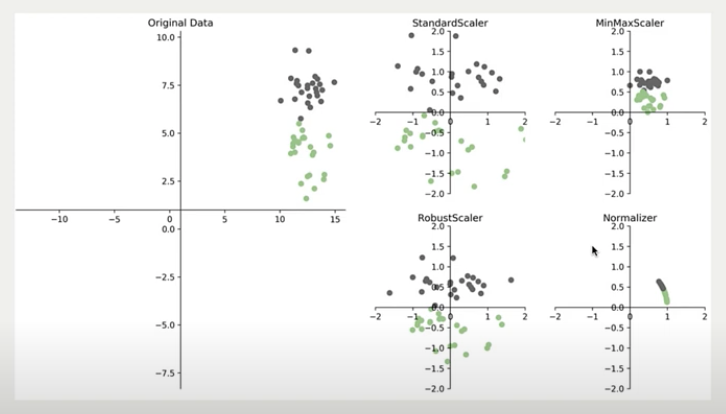

3. In-class lecture
- For each hyperparameter, select how increasing their value would affect the bias/variance tradeoff. \
-- Decision tree - depth: var \
-- k-NN - value of k: bias. bc say k=1, based on 1 sample \
-- SVM - C: var \
-- SVM - Gamma: var
- bias = underfitting, variance = overfitting
- variance: small changes in the training set would impact the classification a lot. 
- decision tree immune to the effect of wrong scaling because DT look at features "one by one". 

- True / False: \
-- Stdscaler ensures a fix range (F) \
-- Stdscaler calculates mean and standard deviation for each feature speraretely (T) \
-- good idea scalin on numerical features before training KNN or SVM. (T) \
-- after normalization, all numerical features in training and test set will have values between 0 and 1.(F) \
-- is it OK to modify features before splitting into training and testing set if the modification is row-wise (T), but not recommended 

rebuttal: Answer 4: when we fit train set has range (0,1), but we also scale the test set so range can go more than (0,1) because new data could be more than 1. Say someone is 7 feet tall, his re scaling could be 1.02, but it would still be useful?

- bad scaling procedures \
-- 1) scaling the data separately. We have to scale the training and testing set together, using the same function, otherwise we end up with different representations. \
-- 2) scaling the data together. We are breaking the golden rule. \
-- 3) cross validation with already preprocessed data

- best scaling procedures: do pre-processing to both training and validation set.

- goal cross-validation: get more robust measure of accuracy. 


4. Pipeline (review content)


5. Categorical features (one-hot encoding)
- for example, languages assigned a number (ordinality). english = 0, french = 1, chinese = 5, etc. 
- issue with that: numbers assign dont make sense, in distance, english closer to french than chinese for no particular reason. 
- in general, label encoding is useful if there is ordinality in tour data and capturing if it is important for your problem (cold, warm, hot). 
- other good examples: lettered grades, survey good to bad. 

- alternative: one-hot encoding. we create new binary columns to represent our categories. ex: english = 1 for a column, and all other columns for the other languages are 0. 

- True / False: \
-- you can glue together imputation and scaling of numeric features and scikit-learn classifier object within a single pipeline (T) \
-- you can glue together scaling of numeric features, one hot encoding of categorical features and scikit-learn classifier object within a single pipeline (F) \
-- Pipelines will `fit` and `transform` on the training fold and only `transform` on the validation fold during cross-validation. (T) \
-- whats the better encoding for weather labels such as sunny, overcast, rainy. one-hot or ordinal? with the given info, one-hot is better, because the ordinality is not clear. 


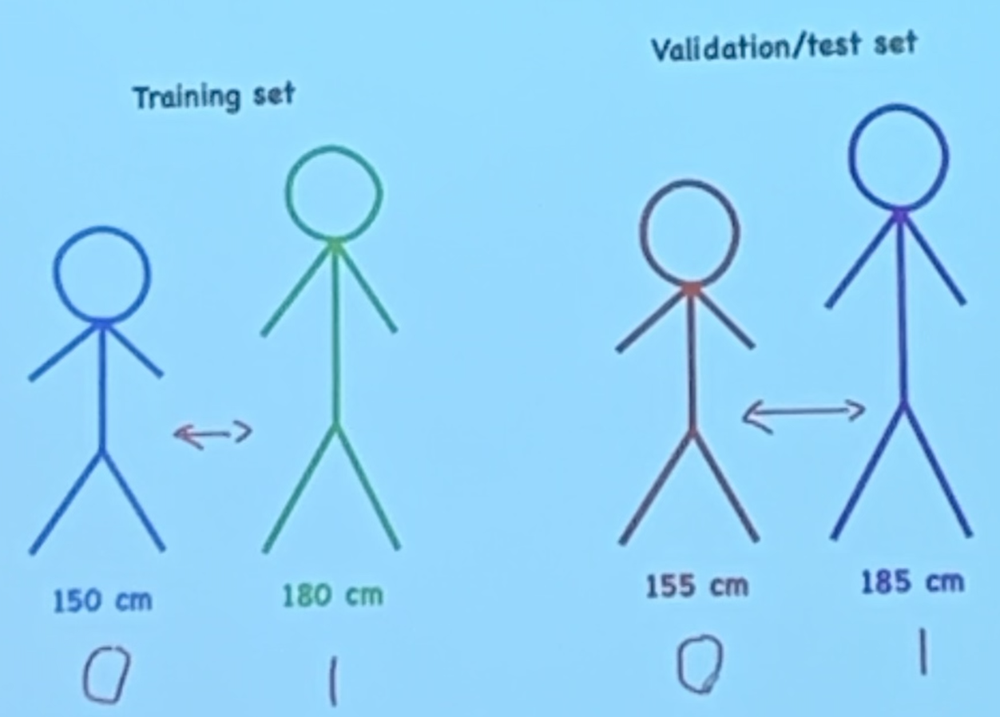

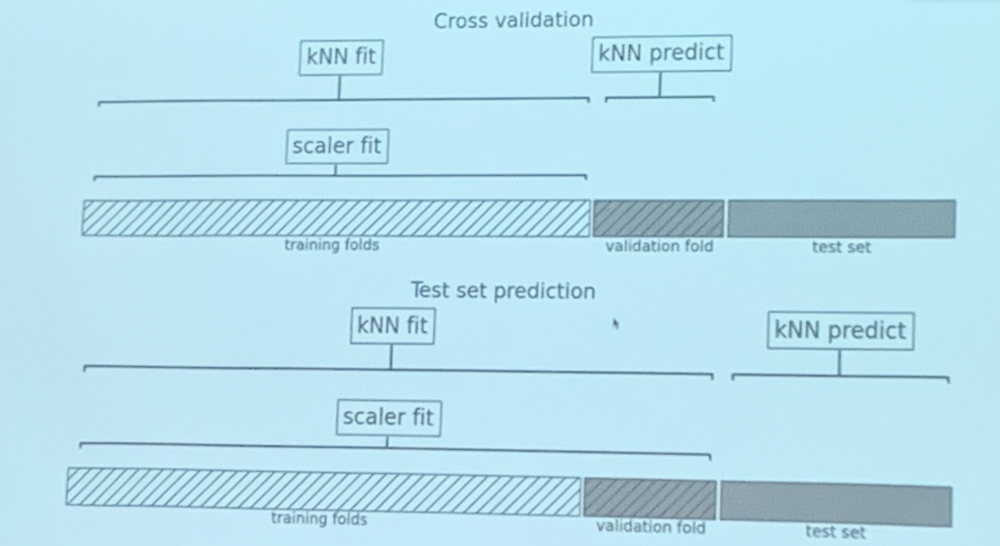

## Lecture 6 Column Transformer


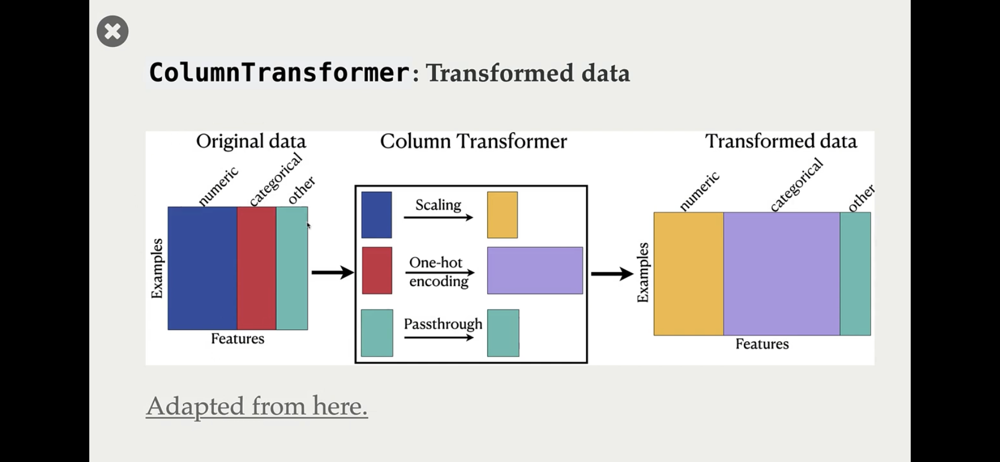

1. Column tranformer
- you can do both imputation and transformations
- imputation + one-hot
- imputation + scaling
- methodology: \
-- put the features together in groups(num, cat, pass, drop) \
-- num: scaling \
-- cat: one-hot \
-- pass: no trans on binary features \
-- drop: no trans 
- "class attendance" ordinal (excellent, good, average, poor). We use OrdinalEncoder on this column. However sometimes the ordering is fcked up. You can order manually: class_attendance = [right order]. Then OrdinalEncoder(categories(order))
- dealing with unknown categories: OneHotEncoder(handle_unknown = 'ignore')
- say biology, one hot encoded, but only 1 instance. for that one fold of biology sample, in the validation set. Best way is to 'nullified' this set, make it 0 for biology but rely on the other features. 


- cases where its OK to break the golden rule' 

If it is some fix number of categories. for ex, if its something like provinces in canada or major at UBC. we konw the categories in advance and this is one of the cases where it might be OK to violate the golden rule and get a list of all possible values for the categorical variable. 

- what if you one-hot a binary category? useless, bc if you know 0 you know which one are 1. thus you can 'drop' one of the 2 columns. 

2. for text input 
- 'bag of words' preprocessing method
- OHE on 'bag of words', then count each count of those words

3. steps 

In [ ]:
df = pd.read_csv("../data/quiz2-grade-toy-col-transformer.csv")
X = df.drop(columns=["quiz2"])
y = df["quiz2"]
X.columns

numeric_feats = [
    "university_years",
    "lab1",
    "lab2",
    "lab3",
    "lab4",
    "quiz1",
]  # apply scaling
categorical_feats = ["major"]  # apply one-hot encoding
ordinal_feats = ["class_attendance"]  # apply ordinal encoding
binary_feats = ["enjoy_course"]  # apply one-hot encoding with drop="if_binary"
passthrough_feats = ["ml_experience"]  # do not apply any transformation
drop_feats = ["enjoy_course"]  # do not include these features

ct = make_column_transformer(
    (
        make_pipeline(SimpleImputer(), StandardScaler()),
        numeric_feats,
    ),  # scaling on numeric features
    (OneHotEncoder(handle_unknown="ignore")), categorical_feats),  # OHE on categorical features
    (OneHotEncoder(drop="if_binary", dtype=int), binary_feats),
    (
        OrdinalEncoder(categories=[class_attendance_levels], dtype=int),
        ordinal_feats,
    ),  # Ordinal encoding on ordinal features
    ("passthrough", passthrough_feats),  # no transformations on the binary features
    ("drop", drop_feats),  # drop the drop features
)

X_transformed = ct.fit_transform(X)
column_names = (
    numeric_feats
    + ct.named_transformers_["onehotencoder"].get_feature_names_out().tolist()
    + ordinal_feats
    + passthrough_feats
)
column_names
pd.DataFrame(X_transformed, columns=column_names)

pipe = make_pipeline(ct, SVC())
scores = cross_validate(pipe, X, y, return_train_score=True)
pd.DataFrame(scores)

<br><br>

## Lecture 7 Linear Models

1. Pre-videos

- Linear models: use linear function of the input features

**A) Linear regression** (predict weight from length) "orange line"
- r.coef_, r.intercept_ (learnt by model to draw line)
- $y = w_1 x_1 + b$
- $y = w_1 x_1 + w_2 x_2 + ... + w_d x_d + b$
- x input features, w coefficients, b bias
- scikit-learn: Ridge, hyperparamter alpha (for fundamental tradeoff)
- large alpha: underfit, and reverse

**B) Logistic regression** model for classification problem
- applies threshold on the raw output to decide whether the class is positive or negative 
- example movie review, pos or neg. features are word
- apply coefficients on words "excellent = 2"
- feature vector for the words chosen: [0 1 0 0 etc]
- score(xi) = coef(boring) x 1 + ... = 1.96 > 0 thus positive 
- here the threshold 'r' is 0 
- access weight and bias using coef_ and intercept_ too
- lr.classes_, neg = canada, pos = USA
- decision boundary of logistic regression: n-1 of the dimension 
- ex: 2 features, thus a 'line' is the decision boundary 
- lin reg less powerful for low dim, but more power as dim go up
- C hyperparameter for fundamental tradeoff. Small C = underfitting 

**C) Predicting probability scores**
- predict_proba: how confi our model is with the given prediction 
- lr.predict([example]): hard prediction (pos/neg) -> the class
- lr.predict_proba(): soft prediction (score of each class) -> prob score
- ex: (0.87, 0.13). 87% being class A
- how? it applies the sigmoid function $\frac{1}{1+e^{-x}}$, score [0,1]
- least confident: closest to boundary decision line (and reverse) 
- however, not always, Alaska fcks up the prediction 


2. HW2 correction 
- in an histogram, we want less overlap as possible to separate classes. However if overlap, doesnt mean they are useless. in combination with other features, it might be useful. 
- when reporting validation or train score, take only 2 decimal numbers, too much noise for other decimals. 

3. Lecture notes
- T/F:\
-- inc the hyper alpha of Ridge is likely to decrease model complexity. (T) \
-- Ridge can be used with datasets that have multiple features. (T) \
-- with Ridge, we learn one coefficient per training example. (F) \
-- if you train a linear reg model on a 2-dim problem (2 features), the model will be a two dimentional plane. (T). Basically, with 2 features, we have 3 dimensions. F1 one axis, F2 one axis, and 'y' prediction on the third axis. So the prediction is a 2D-plane. 

- importance of scaling: have, if not some coefficients will dominate. However, when you scale the data, feature values become hard to interpret for humans. 
- for example: square foot and number of rooms. Increase in 1 number of room has a way larger impact that increase in 1 square foot size. 

- T/F:\
-- supp you have trained a linear model on an unscaled data. the coeff of the linear model have the following interpretation: if coeff $j$ is large, that means a change in feature $j$ has a large impact on the prediction. (T). basically 'y' will go up more for the large coeff feature compared to  a small coeff feature. A "meter" increase has more impact than a "millimeter" increase. \
-- supp the scaled feature value of NOX feature above is negative. the prediction will still be inversely proportional to NOX, as NOX gets bigger, the median house value gets smaller. (T)

- if overfitting using Logistic reg (difference between valid and train score) then play with the hyperparam C till get better. 

### Interpretation of coefficients in linear models 
- the $j$th coefficient tells us how feature $j$ affects the prediction
- if $w_j > 0$ then increasing $x_{ij}$ moves us toward predicting $+1$
- if $w_j < 0$ then increasing $x_{ij}$ moves us toward prediction $-1$
- if $w_j == 0$ then the feature is not used in making a prediction

<br><br>

## Lecture 8 HP tuning

1. Pre-lecture 

A. Hyperparameter optimization motivation 

- We can improve the model's generalization performance by tuning model hyperparameters using cross-validation on the training set. 
- Reminder: in decision tree, HP is max_depth, dont want = 1 (underfit), dont want = max (overfit)
- ways pick HP: expert manual knowledge, heuristics based optmization, automated optimization.
- Automated HP opt: formulate the HP opt as a one big search problem (but sometimes too big, infeasible)
- have a parameter grid (range best HP), apply on cross-validation 
- basically nested for loop over range of HP and print best score
- common process, scikit-learn has standard method to do this

B. Overfitting of the validation error 
- If our dataset is small and if your validation set is hit too many times, we suffer from opt bias or overfitting the validation set
- we might opt the validation error over 1000 values of max_depth, and one of the 1000 trees might have low validation error by chance
- ex: spotify data, gamma = 30, C = 30, 900 possibilities. Validation score best = 0.80 however, on test score = 0.60.
- if test score much lower than CV score: try simpler models, use the test set a couple of times, communicate this clearly in report
- large datasets solve many of these problems

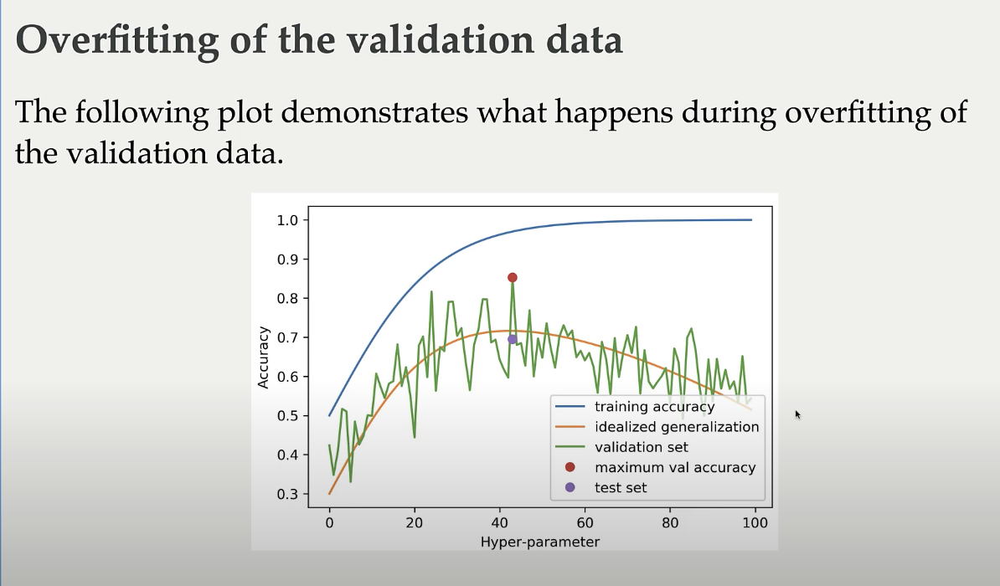

2. Lecture notes
- GridSearch: expanding the 'search' dimension of HP. so at least 2 HP at same time.
- use GridSearchCV, create pipeline, then param_grid = {'HP1':[v1,v2,v3],'HP2'...}.
- evaluate each combination one by one. However possible that the right combi is not present in the exhaustive search. 
- why best_score from gridsearch differ from test score? There is a chance we got lucky in the combi of HP, thus creating overfitting on the validation set.
- n_jobs=-1: Hyperparameter optimization can be done in parallel for each of the configurations.


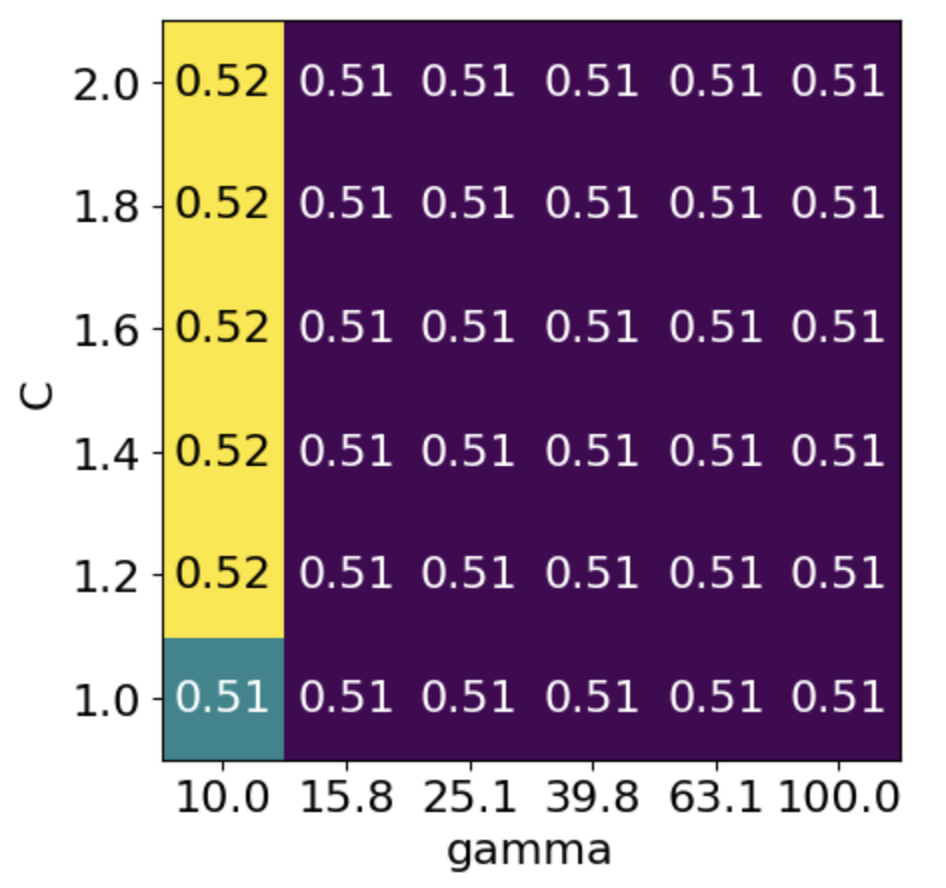


- here, range is wrong for C, and scale is wrong for gamma. 
- modify range for C, maybe apply 'log' transformation on gamma range (0.001,0.01,0.1,...100)
- process: start "large" grid and narrow it down to find the wanted one
- issue: scale, if more HP or a lot of scaling to do
- best alt: RandomizedSearchCV. for n_iter: pick 10 random intersections of the grid. 
- best best alt: give probability distribs to draw from, still on RandomSearchCV. ex: "HP1": uniform(0.1,1e4) or "HP2": loguniform(1e-5,1e3).
- it works better when some HP are more important

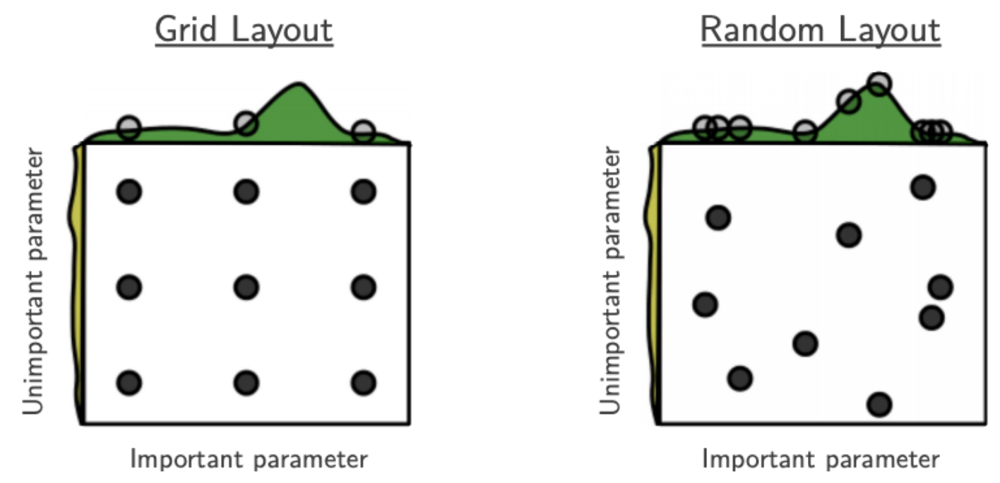

- grid layout: out of 9 searches, only 3 important. other 6 dont provide much because they are only varying the unimportant parameter.
- random layout: explore more options. all 9 searches are useful. 



Questions:
- suppose you have 10 HP, each with 4 possible values. If you run GridSearchCV with this parameter grid, how many CV experiments would it carry out? **A: 4^10. formula: $values^{hyper}$**
- GridSearchCV exhaustively searches the grid and so its guaranteed to give you the optimal HP for the given problem. **A: false. since the optimal HP could be 'in-between' the grid.** 
- is it possible to get different HP in different runs of RandomizedSearchCV? **A: YES, bc each run is different since random.**
- suppose you have 10 HP and each takes 4 values. if you run RandomSearchCV with this parameter grid, how many cross-validation experiments it would carry out? **A: depends on the set value of n_iter we want.** 
- We have used both uniform and log distribution to set the parameters search space. Is one better? why? **A: uniform: linear space of equal prob (say 1 to 10000, inc by 2000). If we want to see 0.01, very hard to see this sample. loguniform: log space of equal prob (say 0.00001 to 1000, inc by e^1). Thus the small differences are more meaningful, we can see them. So loguniform is better**.

- recommendation: Start with a log search, to understand what range works for us. Then work from there

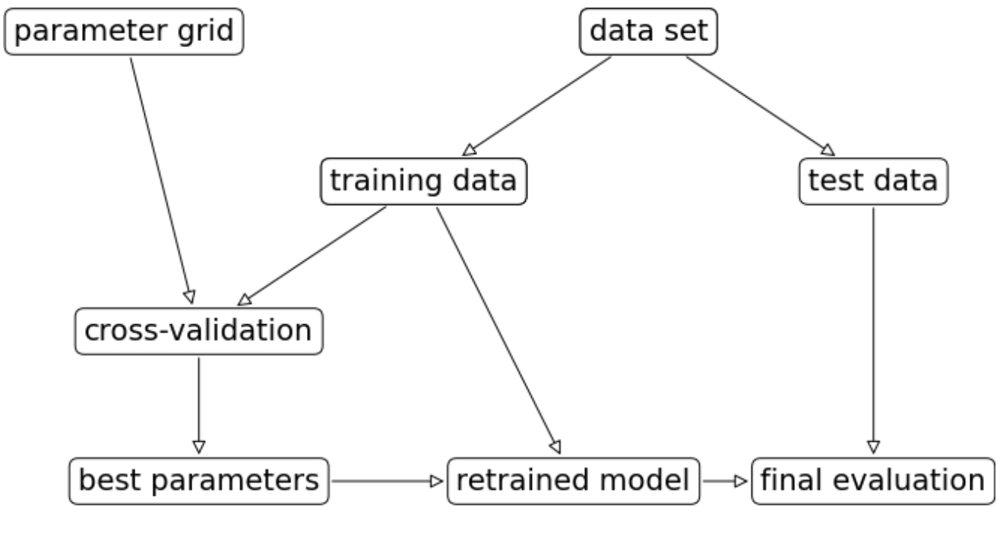

In [1]:
pipe_svm = make_pipeline(StandardScaler(), SVC(**best_parameters))

param_grid = {
    "svc__gamma": [0.001, 0.01, 0.1, 1.0, 10, 100],
    "svc__C": [0.001, 0.01, 0.1, 1.0, 10, 100],
}

grid_search = GridSearchCV(
    pipe_svm, param_grid, cv=5, n_jobs=-1, return_train_score=True
)

NameError: name 'make_pipeline' is not defined

In [ ]:
param_grid = {
    "svc__gamma": [0.001, 0.01, 0.1, 1.0, 10, 100],
    "svc__C": [0.001, 0.01, 0.1, 1.0, 10, 100],
}
random_search = RandomizedSearchCV(
    pipe_svm, param_distributions=param_grid, n_jobs=-1, n_iter=10, cv=5, random_state=123
)
random_search.fit(X_train, y_train);
pd.DataFrame(random_search.cv_results_)[
    [
        "mean_test_score",
        "param_svc__gamma",
        "param_svc__C",
        "mean_fit_time",
        "rank_test_score",
    ]
].set_index("rank_test_score").sort_index().T

<br><br>

## Lecture 9 Classification metrics

1. Pre-lecture

A. Confusion Matrix
- give info about true pos, true neg, false pos, false neg
- plot_confusion_matrix
- pass X_valid, Y_valid
- false pos: flagged as fraud when it was not fraud
- false neg: not flagged as fraud when it was fraud
- want spot a class (distinguish between 2 classes)
- from sklearn.metrics import confusion_matrix
- from sklearn.model_selection import cross_val_predict

B. Precision, Recall, f1 score
- need other metrics than .score (accuracy)
- accuracy is misleading when you have class imbalance. 
- **recall** = $\frac{TP}{TP+FN} = \frac{TP}{\# positives}$. (SENSITIVITY). How many did we correctly identify as pos among all pos predicted examples
- **precision** = $\frac{TP}{TP+FP}$. (HOW LIKELY CORRECT). How many were acc pos among the real pos examples?
- **f1-score**: combines precision and recall. Could be used as a HP. F1 is a harmonic mean of precision and recall:
$f_1 = 2 \times \frac{precision \times recall}{precision + recall}$
- can look all metrics all at once (video 9.3, 5:00).
- use classification_report
- macro weight: equal importance to all classes
- weighted avrg: equal importance to all samples
- cross_val use accuracy by default, but can change it

C. Dealing with class imbalance
- def: when many examples of non-fraud but not many of fraud 
- ex: ads click rate. 200 ads, just click a few. 
- ask ourselves: why do we have class imbalance? 
- is it nature of study? if so we want reduce false neg (flag fraud when its not)
- is it bc of data collection methods? it means your test and training data come from different distributions 
- if want high recall score, use a lower threshold (catch more fraud)
- handling imbalance: 1. changing the data (under/oversampling, random sampling). for ex: reducing the number of higher imbalance class to match the lower one. 2. changing the training procedure (class_weight).
- class_weight = {0:1, 1:10}. weight 1 to class 0, weight 10 to class.
- class_weight = "balanced". say we have for each fraud example. we have 500 non-fraud examples. means repeat this fraud example 500 times so that we have equal amount fraud and non-fraud (does it in fit auto).
- effect: reduce FN but increase FP. 
- usually test_recall go up and test_precision go down, need judge if precision too low for us. 
- stratifying: by default if we have 10% neg examples in total, then each split will have 10$ neg examples. 

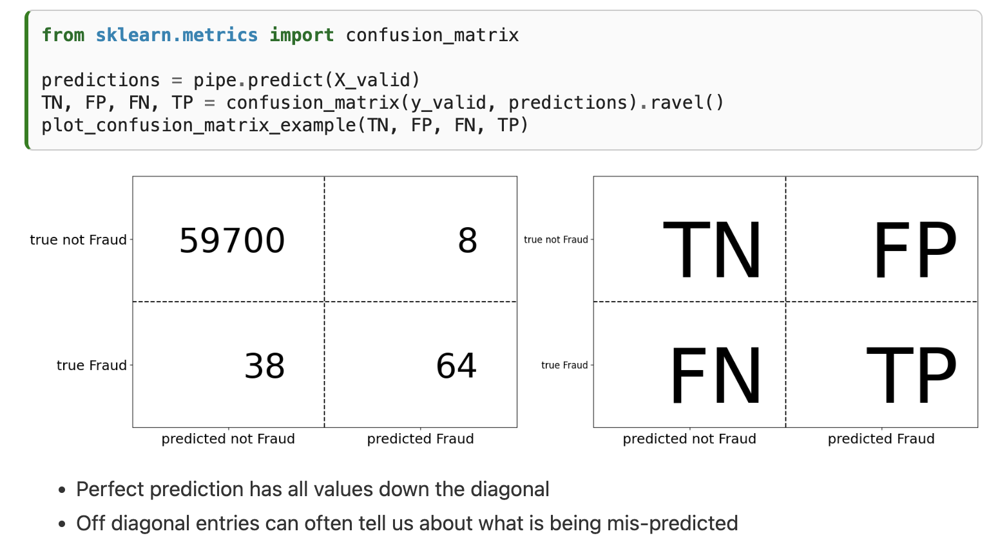

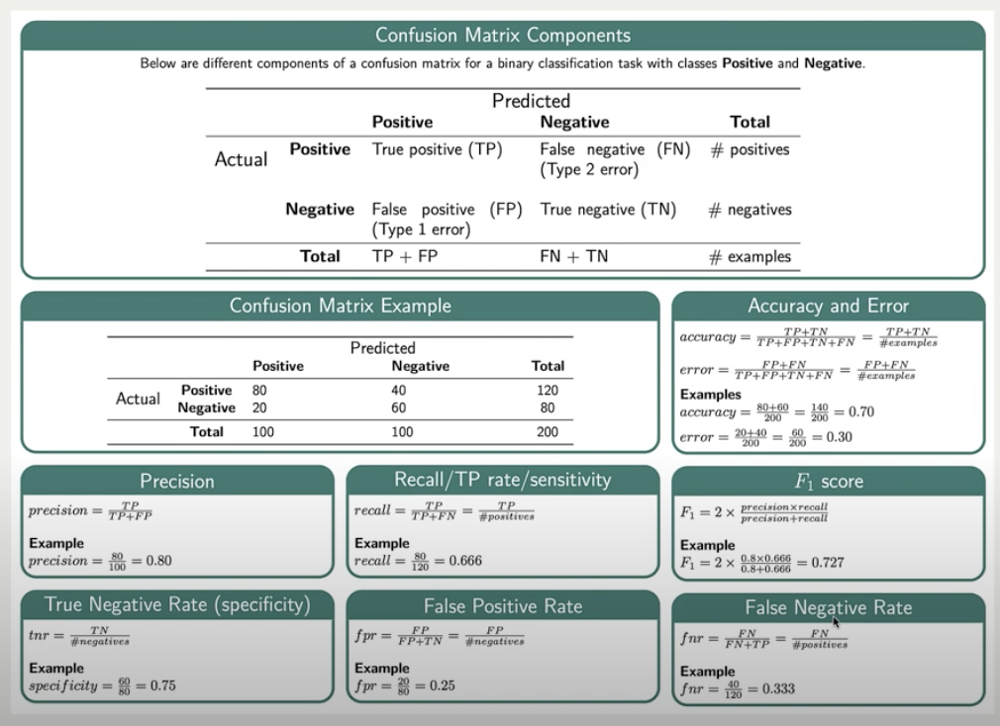

2. Lecture notes


A. midterm: lect 1-10
- not rlly learn the code
- more concepts and vocab
- we have a practice MT 
- hw closest 

B. credit card fraud data
- training and CV score 0.98 (accuracy) for baseline, perfect model. thats bad. we have a lot class imbalance. With logistic regression score is 0.99. so is model any good? we dont know so we need to use another scoring metric.
- if we used the dummyC, the confusion matrix would show 0 in FP/FN cuz 99% accuracy 
- if we have to choose one of recall or precision, recall is better because it is safer. Medical analogy: better say to someone that they have cancer, do checks and they dont have cancer, than a case where someone has actually cancer but we tell them than they dont. 
- precision > recall when would like to have less false pos than more false neg. 
- ex: spam filter. Better a spam in inbox than a good email in spam folder. 
- typically: POS case is the minority class. 

C. average
- macro avrg is normal avrg, same importance to classes independent how big those classes are.
- weighted avrg: if type errors importance are equivalent for both classes. FP and FN are as bad. 

D. Questions
- in medical diagnosis, false pos are more damaging that false neg (pos = disease, neg = no disease). (F)
- in spam classification, false pos are more damaging than false neg (pos = spam, neg = no spam). (T)
- in the medical diagnosis, high recall is more important than high precision. (T)
- what is the only metric that does not change if the pos class is changed? (accuracy)
- if the cost of each mistake is equal independently of the decision, it is more informative to look at the macro average of the metrics. (F) 

E. Important
- more importance for false negative == recall more important
- more importance for false positive == precision more important

F. Precision-Recall curve 
- logistic regression. Say sample S1 = [0.4,0.6], pos\neg. If threshold 0.5, then this sample flagged as neg. 
- want more sensitive, thus decrease threshold to 0.3. thus S1 is flagged pos now. 
- how do we pick the threshold value? can make array [0,1,0.1] and compute all the metrics. Choose from the trade-off. 
- PR curve below
- top-left: threshold 0, bot-right: threshold 1. if threshold 0, we catch all as positive, so recall high. reverse.
- AP score is Average Precision score (area under curve PR, 0 low, 1 high). It is a summary across thresholds (summarize PR plot) and measures the quality of predict_proba. 
- conversely, F1 score is for a given threshold and measures the quality of predict. 

G. ROC curve
- analyze behavior of classifiers at different thresholds
- it plots false positive rate (FPR) and true positive rate (TPR or recall)
- $\frac{TP}{TP+FN}$ and $\frac{FP}{FP+TN}$ 
- best top left

H. AUC curve
- shows precision 
- AUC provides a single meaningful number for the model performance.
- AUC can be interpreted as evaluating the ranking of positive examples.
- AUC of 1.0 means all positive points have a higher score than all negative points.

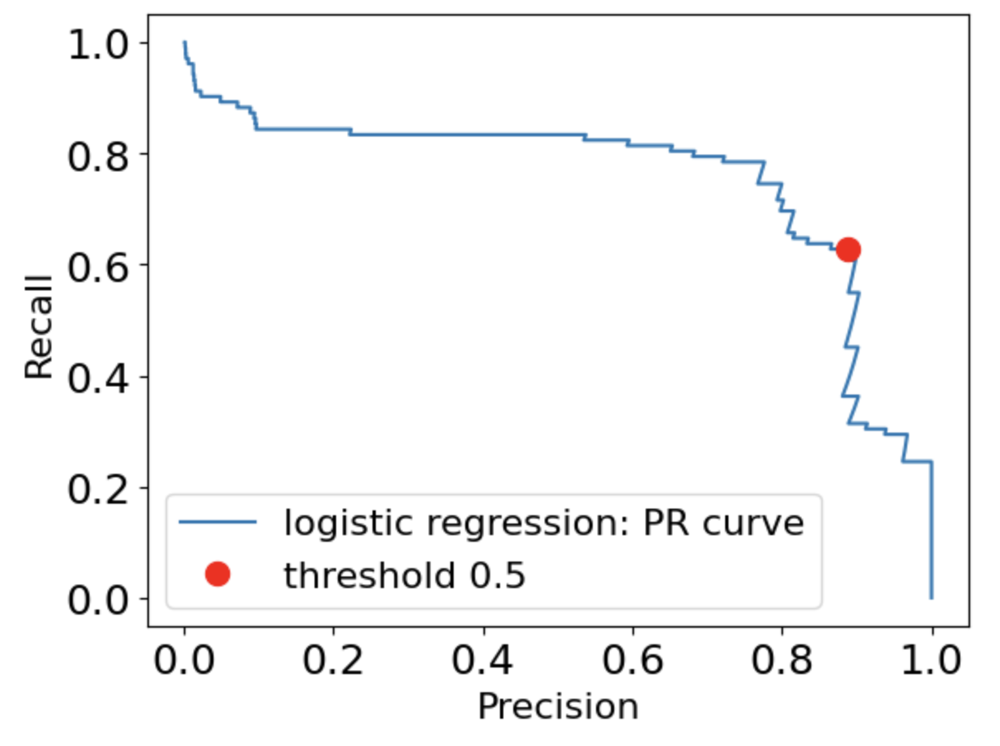

- top-left: threshold 0, bot-right: threshold 1. if threshold 0, we catch all as positive, so recall high. reverse.

<br><br>

## Lecture 10 (Regression metrics)

1. Pre-lecture
- preprocessing housing price dataset
- split the data, then call .describe. notice not too big data (1000 rows). notice ID column can drop and some columns miss some data. 
- from panda_profiling import ProfileReport. Give overview and detailed info about variables. 
- numeric columns: 
variable = X_train.select_dtypes(incliude=np.number).columns.tolist
- however sometimes column encoded with numbers but they are categorical features
- for ordinal feat, the regular (poor to excellent) -> ordinal_features_reg. if different scale -> ordinal_features_oth (video 10.1, min 9:30)
- ColumnTransformer: useful to apply diff trans to diff features types 
- updated pipeline: video 10.1 min 11:00.


2. Lecture notes

A. preprocessing (pre-video)

B. model building
- dummy: training score is zero: by default, my prediction is the mean, so "0 = no improvement from the mean"
- tuning alpha HP of Ridge, try diff values of Alpha 
- plot of CV and Train score by alpha, is reversed. As alpha grows, the scores eventually fall. 
- As alpha goes up, introduce some bias and reduce complexity of model. 
- RidgeCV automatically tunes alpha for cross-val

C. Regression score functions
- not classification, we cannot just check equality (we are comparing numbers so return false)
- four metrics: Mean squared error (MSE), $R^2$, root mean squared error (RMSE), MAPE

C.a) **MSE**: from sklearn.metrics import mean_squared_error. mean_squared_error(y_train,preds). Say we do that on Dollar, the MSE will give dollar^2. We then do **RMSE** to get square root and get Dollar back. Perfect prediction is 0. 

C.b) $R^2$: called by sklearn score() by default. Max is 1 for perfect prediction. Neg values are bad, worse than dummy regressor. $$R^2(y,y_{hat}) = 1 - \frac{\sum^n_{i=1} (y_i - y_{ihat})^2}{\sum^n_{i=1} (y_i - y^{bar})^2}$$
- how better you are than guessing the average. $y_i$ = actual values. $y_{ihat}$ = predicted values. $y^{bar}$ = mean value

C.c) **MAPE**: 
- is the RMSE error acceptable: depends on the value $y_i$. If 300k its a low error, if 60k its a high error.
- Mean Absolute Percentage Error: take mean abs error, then take mean. Say we get 0.10. It means that on average we have 10% error. 

D. Distributions
- If we have high outliers, we can TransformTargetRegressor and change the distribution to np.loglp which transforms the model to normal log. Then, the larger outliers have less impact. MAPE is now lower.
- neg_MSE because we want to minimize the score, so we take the negative to "flip" the scores (we want low).
- default of argument is great_is_better, then false if want reverse. 

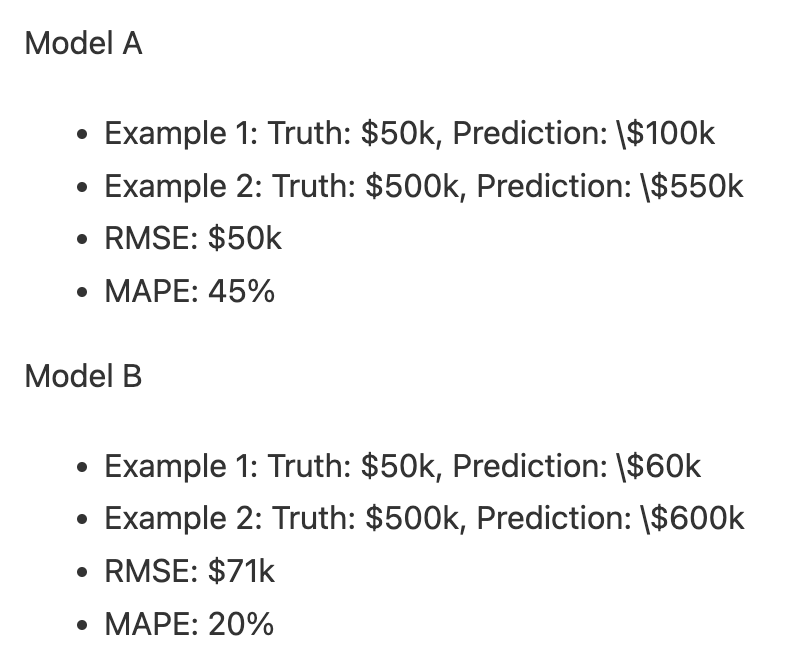